In [1]:
## For colab usage
from google.colab import drive
drive.mount('/content/drive')

%cd drive/My Drive/Colab Notebooks/project

Mounted at /content/drive
/content/drive/My Drive/Colab Notebooks/project


In [2]:
import pandas as pd
import datetime
aggregated_data_pivot = pd.read_csv('Day_aggregated_data_pivot.csv')

In [3]:
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix


### Main question1: Can we predict the onset of future Treatment based on past symptom and condition data

In [4]:
# Define feature columns
symptom_cols = [col for col in aggregated_data_pivot.columns if col.startswith('Symptom_')]
treatment_cols = [col for col in aggregated_data_pivot.columns if col.startswith('Treatment_')]
weather_cols = [col for col in aggregated_data_pivot.columns if col.startswith('Weather_')]
condition_cols = [col for col in aggregated_data_pivot.columns if col.startswith('Condition_')]

# Define X (features) and y (target)
X = aggregated_data_pivot[symptom_cols + condition_cols ]
y = aggregated_data_pivot[treatment_cols].idxmax(axis=1)  # Select the condition with the highest value


In [5]:
from sklearn.model_selection import train_test_split

# Train-test split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=42, stratify=y)


In [6]:
from sklearn.model_selection import train_test_split

# Initial stratified split: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, random_state=42, stratify=y
)

# Secondary stratified split: 50% validation, 50% test (of temp set)
X_valid, X_test, y_valid, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)

# Verify class distribution
from collections import Counter
print("Train Class Distribution:", Counter(y_train))
print("Valid Class Distribution:", Counter(y_valid))
print("Test Class Distribution:", Counter(y_test))


Train Class Distribution: Counter({'Treatment_Ibuprofen': 1841, 'Treatment_Cymbalta': 1191, 'Treatment_Advil': 944, 'Treatment_Gabapentin': 868, 'Treatment_Adderall': 763, 'Treatment_Exercise': 737, 'Treatment_Benadryl': 734, 'Treatment_Aleve': 709, 'Treatment_Tylenol': 678, 'Treatment_CBD': 674, 'Treatment_Acetaminophen': 622, 'Treatment_Bupropion': 542, 'Treatment_Magnesium': 524, 'Treatment_Flonase': 449, 'Treatment_Levothyroxine': 442, 'Treatment_Baclofen': 422, 'Treatment_Duloxetine': 420, 'Treatment_Plaquenil': 407, 'Treatment_Tramadol': 405, 'Treatment_Prednisone': 394, 'Treatment_Claritin': 390, 'Treatment_Fish oil': 387, 'Treatment_Allegra': 350, 'Treatment_Naproxen': 335, 'Treatment_Buspirone': 322, 'Treatment_Clonazepam': 314, 'Treatment_Vitamin D3': 311, 'Treatment_Meditation': 299, 'Treatment_Cyclobenzaprine': 299, 'Treatment_Amitriptyline': 272, 'Treatment_Fludrocortisone': 267, 'Treatment_Celebrex': 249, 'Treatment_Lyrica': 242, 'Treatment_Omeprazole': 237, 'Treatment_Ca

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Validate the model
y_valid_pred = rf_model.predict(X_valid)
valid_accuracy = accuracy_score(y_valid, y_valid_pred)

print("Validation Accuracy:", valid_accuracy)
#print("Validation Classification Report:")
#print(classification_report(y_valid, y_valid_pred))

# Test the model
y_test_pred = rf_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Test Accuracy:", test_accuracy)
#print("Test Classification Report:")
#print(classification_report(y_test, y_test_pred))

# Confusion matrix (optional)
print("Confusion Matrix on Test Data:")
print(confusion_matrix(y_test, y_test_pred))


Validation Accuracy: 0.8833005893909627
Test Accuracy: 0.8799607072691552
Confusion Matrix on Test Data:
[[120   0   0 ...   0   0   0]
 [  1 143   0 ...   1   0   0]
 [  0   1  25 ...   0   0   0]
 ...
 [  0   0   0 ...  12   0   0]
 [  0   0   0 ...   0  31   0]
 [  0   0   0 ...   0   0   3]]


In [ ]:
# Extract feature importance
importances = rf_model.feature_importances_
feature_names = X.columns

# Combine feature names and importance into a DataFrame
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort features by importance
top_features = feature_importances.sort_values(by='Importance', ascending=False).head(20)

print("Top 20 Features:")
print(top_features)


Top 20 Features:
                           Feature  Importance
35                Symptom_Headache    0.020200
45              Symptom_Joint pain    0.017164
27                 Symptom_Fatigue    0.017001
108              Condition_Anxiety    0.016205
66                  Symptom_Nausea    0.016200
127           Condition_Depression    0.016178
10               Symptom_Brain fog    0.016117
18                Symptom_Diarrhea    0.015335
3                  Symptom_Anxiety    0.015207
28   Symptom_Fatigue and tiredness    0.015167
20               Symptom_Dizziness    0.013207
137         Condition_Fibromyalgia    0.012570
5                Symptom_Back pain    0.012459
67               Symptom_Neck pain    0.012401
17              Symptom_Depression    0.012361
58                Symptom_Migraine    0.012241
160             Condition_Migraine    0.011845
15            Symptom_Constipation    0.011747
63             Symptom_Muscle pain    0.010072
0           Symptom_Abdominal pain    0.009

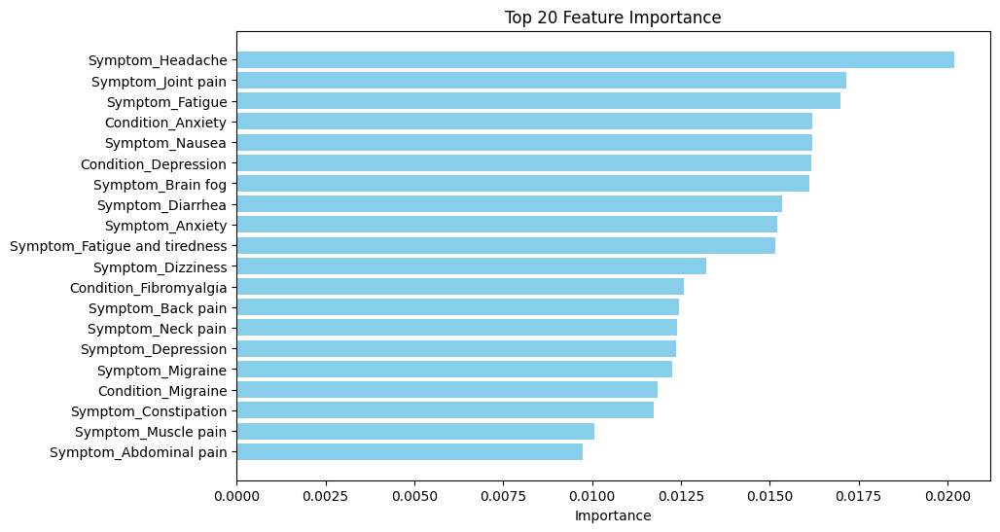

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 20 features
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.xlabel('Importance')
plt.title('Top 20 Feature Importance')
#plt.savefig('random_forest/top_20_feature_importance.pdf')  # Save to file
plt.show()


In [ ]:
from sklearn.tree import export_graphviz
from IPython.display import Image
import pydotplus

# Export a single decision tree
tree = rf_model.estimators_[0]  # Get the first tree in the forest
dot_data = export_graphviz(
    tree, out_file=None,
    feature_names=X.columns,
    class_names=rf_model.classes_,
    filled=True, rounded=True, special_characters=True
)
graph = pydotplus.graph_from_dot_data(dot_data)

# Display the tree
Image(graph.create_png())


dot: graph is too large for cairo-renderer bitmaps. Scaling by 0.114358 to fit



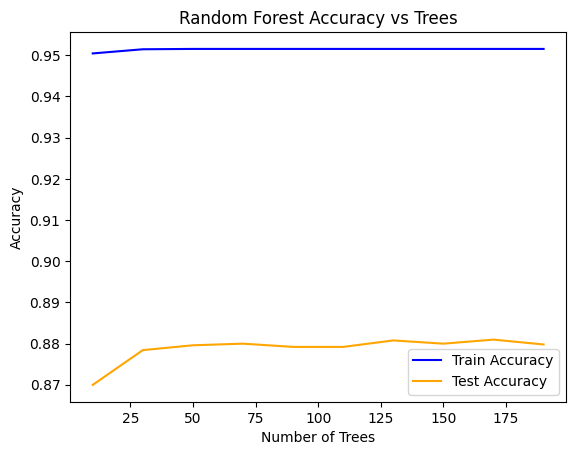

In [ ]:
# Random Forest Accuracy vs Trees
n_trees = range(10, 200, 20)
rf_train_accuracy = []
rf_test_accuracy = []

for n in n_trees:
    rf_temp = RandomForestClassifier(n_estimators=n, random_state=42)
    rf_temp.fit(X_train, y_train)
    rf_train_accuracy.append(rf_temp.score(X_train, y_train))
    rf_test_accuracy.append(rf_temp.score(X_test, y_test))

plt.plot(n_trees, rf_train_accuracy, label='Train Accuracy', color='blue')
plt.plot(n_trees, rf_test_accuracy, label='Test Accuracy', color='orange')
plt.xlabel('Number of Trees')
plt.ylabel('Accuracy')
plt.title('Random Forest Accuracy vs Trees')
plt.legend()
plt.savefig('rf_Q1_accuracy_vs_trees.pdf')
plt.show()

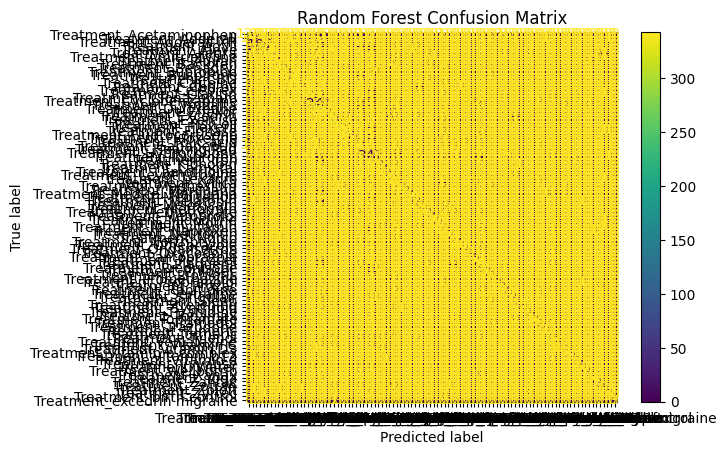

In [ ]:
from sklearn.metrics import ConfusionMatrixDisplay

ConfusionMatrixDisplay.from_predictions(y_test, y_test_pred, display_labels=rf_model.classes_)
plt.title('Random Forest Confusion Matrix')
plt.show()


### Main question2: Can we predict the condition based on past symptom and treatment?

In [ ]:
# Define X and y
X = aggregated_data_pivot[symptom_cols ]
y = aggregated_data_pivot[condition_cols].idxmax(axis=1)  # Choose the treatment with the highest value


In [ ]:
from sklearn.model_selection import train_test_split

# Filter out classes with fewer than 5 samples
min_samples = 5
valid_classes = [cls for cls, count in Counter(y).items() if count >= min_samples]
valid_mask = [y in valid_classes for y in y]

# Filter X and y
X_filtered = X[valid_mask]
y_filtered = y[valid_mask]

# Check distribution again
print("Filtered Class Distribution (Min 5 Samples):")
print(Counter(y_filtered))


Filtered Class Distribution (Min 5 Samples):
Counter({'Condition_Anxiety': 6818, 'Condition_Fibromyalgia': 2858, 'Condition_Depression': 1978, 'Condition_ADHD': 1544, 'Condition_Chronic fatigue syndrome': 1500, 'Condition_Allergies': 1323, 'Condition_Asthma': 1224, 'Condition_Arthritis': 1178, 'Condition_Chronic Migraines': 1133, 'Condition_Lyme disease': 962, 'Condition_Migraine': 953, 'Condition_Abdominal pain': 783, 'Condition_Ehlers-Danlos syndrome': 641, 'Condition_Fatigue': 597, 'Condition_Acid Reflux': 527, 'Condition_Back pain': 471, "Condition_Hashimoto's disease": 468, 'Condition_Lupus': 463, 'Condition_Headaches': 445, 'Condition_Multiple sclerosis': 443, 'Condition_Adult ADHD': 374, 'Condition_Dysautonomia': 371, 'Condition_Chronic Pain': 355, 'Condition_Ankylosing spondylitis': 354, 'Condition_Chronic daily headaches': 313, "Condition_Crohn's disease": 311, 'Condition_systemic lupus erythematosus': 297, 'Condition_GERD': 282, 'Condition_Degenerative Disc Disease': 272, 'Co

In [ ]:

# Initial stratified split: 70% train, 30% temp
X_train, X_temp, y_train, y_temp = train_test_split(
    X_filtered, y_filtered, test_size=0.3, random_state=42, stratify=y_filtered
)

# Secondary stratified split: 50% validation, 50% test (of temp set)
X_valid, X_test, y_valid, y_test = train_test_split(
    X_temp, y_temp, test_size=0.5, random_state=42, stratify=y_temp
)

# Verify class distribution
from collections import Counter
print("Train Class Distribution:", Counter(y_train))
print("Valid Class Distribution:", Counter(y_valid))
print("Test Class Distribution:", Counter(y_test))


Train Class Distribution: Counter({'Condition_Anxiety': 4773, 'Condition_Fibromyalgia': 2001, 'Condition_Depression': 1384, 'Condition_ADHD': 1081, 'Condition_Chronic fatigue syndrome': 1050, 'Condition_Allergies': 926, 'Condition_Asthma': 857, 'Condition_Arthritis': 824, 'Condition_Chronic Migraines': 793, 'Condition_Lyme disease': 673, 'Condition_Migraine': 667, 'Condition_Abdominal pain': 548, 'Condition_Ehlers-Danlos syndrome': 449, 'Condition_Fatigue': 418, 'Condition_Acid Reflux': 369, 'Condition_Back pain': 330, "Condition_Hashimoto's disease": 328, 'Condition_Lupus': 324, 'Condition_Headaches': 311, 'Condition_Multiple sclerosis': 310, 'Condition_Adult ADHD': 262, 'Condition_Dysautonomia': 260, 'Condition_Ankylosing spondylitis': 248, 'Condition_Chronic Pain': 248, 'Condition_Chronic daily headaches': 219, "Condition_Crohn's disease": 218, 'Condition_systemic lupus erythematosus': 208, 'Condition_GERD': 197, 'Condition_Degenerative Disc Disease': 190, 'Condition_Rheumatoid arth

In [ ]:
from sklearn.ensemble import RandomForestClassifier

# Initialize Random Forest Classifier
rf_model = RandomForestClassifier(n_estimators=100, random_state=42)

# Train the model
rf_model.fit(X_train, y_train)

RandomForestClassifier(random_state=42)

In [ ]:
# Validate the model
y_valid_pred = rf_model.predict(X_valid)
valid_accuracy = accuracy_score(y_valid, y_valid_pred)

print("Validation Accuracy:", valid_accuracy)
#print("Validation Classification Report:")
#print(classification_report(y_valid, y_valid_pred))

# Test the model
y_test_pred = rf_model.predict(X_test)
test_accuracy = accuracy_score(y_test, y_test_pred)

print("Test Accuracy:", test_accuracy)
#print("Test Classification Report:")
#print(classification_report(y_test, y_test_pred))

# Confusion matrix (optional)
print("Confusion Matrix on Test Data:")
print(confusion_matrix(y_test, y_test_pred))

Validation Accuracy: 0.8914667715296893
Test Accuracy: 0.8916846864556713
Confusion Matrix on Test Data:
[[217   0   0 ...   0   0   0]
 [  0 106   0 ...   0   0   0]
 [  0   0  75 ...   0   0   0]
 ...
 [  0   0   0 ...   9   0   0]
 [  0   0   0 ...   0   7   0]
 [  0   0   0 ...   3   0  37]]


In [ ]:
# Extract feature importance
importances = rf_model.feature_importances_
feature_names = X.columns

# Combine feature names and importance into a DataFrame
feature_importances = pd.DataFrame({'Feature': feature_names, 'Importance': importances})

# Sort features by importance
top_features = feature_importances.sort_values(by='Importance', ascending=False).head(20)

print("Top 20 Features:")
print(top_features)

Top 20 Features:
                          Feature  Importance
35               Symptom_Headache    0.030844
27                Symptom_Fatigue    0.028259
10              Symptom_Brain fog    0.026464
45             Symptom_Joint pain    0.024600
3                 Symptom_Anxiety    0.024122
28  Symptom_Fatigue and tiredness    0.023843
20              Symptom_Dizziness    0.021497
17             Symptom_Depression    0.021013
18               Symptom_Diarrhea    0.020935
66                 Symptom_Nausea    0.019678
67              Symptom_Neck pain    0.019083
58               Symptom_Migraine    0.017732
5               Symptom_Back pain    0.017601
63            Symptom_Muscle pain    0.017389
15           Symptom_Constipation    0.017332
53        Symptom_Lower Back Pain    0.016908
0          Symptom_Abdominal pain    0.015171
40               Symptom_Insomnia    0.015144
30              Symptom_Foot pain    0.013958
38               Symptom_Hip pain    0.013582


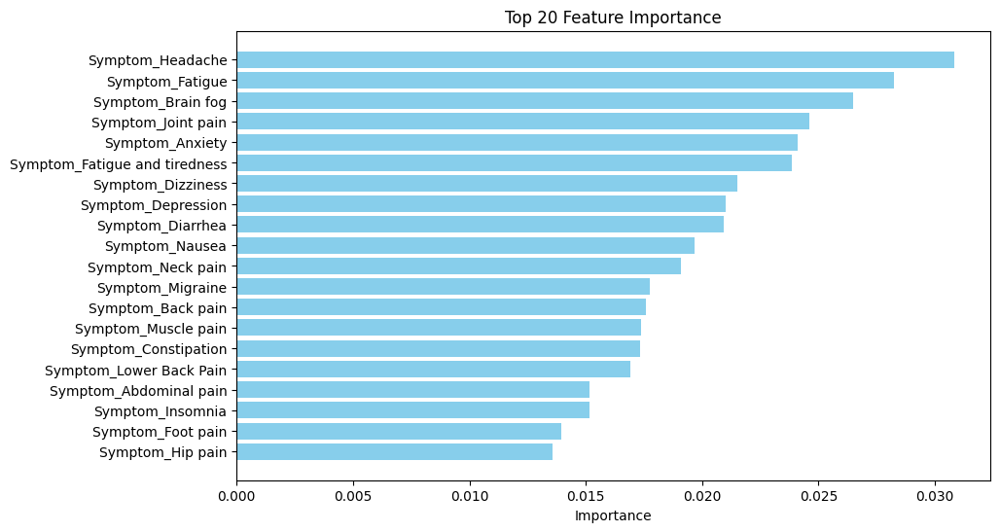

In [ ]:
import matplotlib.pyplot as plt

# Plot the top 20 features
plt.figure(figsize=(10, 6))
plt.barh(top_features['Feature'], top_features['Importance'], color='skyblue')
plt.gca().invert_yaxis()  # Invert y-axis for better readability
plt.xlabel('Importance')
plt.title('Top 20 Feature Importance')
#plt.savefig('random_forest/top_20_feature_importance.pdf')  # Save to file
plt.show()


In [ ]:
aggregated_data_pivot.head()

,Unnamed: 0,user_id_,checkin_date_,Condition_ADHD,Condition_Abdominal pain,Condition_Acid Reflux,Condition_Acne,Condition_Adult ADHD,Condition_Allergies,Condition_Anemia,...,Treatment_excedrin migraine,Weather_clear-day,Weather_cloudy,Weather_fog,Weather_partly-cloudy-day,Weather_partly-cloudy-night,Weather_rain,Weather_sleet,Weather_snow,Weather_wind
0,0,QEVuQwEA+/tEquKas1s6wFVgiluL5A==,2017-02-15,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
1,1,QEVuQwEA+/tEquKas1s6wFVgiluL5A==,2017-02-16,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,2,QEVuQwEA+0iYpKbaKsnzp+whYmvqAg==,2019-10-13,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,3,QEVuQwEA+0iYpKbaKsnzp+whYmvqAg==,2019-10-18,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,4,QEVuQwEA+1bR8DYerwazc7JKBtDL9g==,2018-12-11,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [ ]:
# Select columns starting with 'Treatment_'
treatment_cols = [col for col in aggregated_data_pivot.columns if col.startswith('Treatment_')]

# Find the column with the maximum frequency for each row
aggregated_data_pivot['max_treatment'] = aggregated_data_pivot[treatment_cols].idxmax(axis=1)

# Check the result
print(aggregated_data_pivot[['user_id_', 'checkin_date_', 'max_treatment']].head())


                           user_id_ checkin_date_            max_treatment
0  QEVuQwEA+/tEquKas1s6wFVgiluL5A==    2017-02-15      Treatment_Metformin
1  QEVuQwEA+/tEquKas1s6wFVgiluL5A==    2017-02-16  Treatment_Levothyroxine
2  QEVuQwEA+0iYpKbaKsnzp+whYmvqAg==    2019-10-13       Treatment_Fish oil
3  QEVuQwEA+0iYpKbaKsnzp+whYmvqAg==    2019-10-18      Treatment_Ibuprofen
4  QEVuQwEA+1bR8DYerwazc7JKBtDL9g==    2018-12-11       Treatment_Cymbalta


In [ ]:
import pandas as pd

# Convert `checkin_date_` to datetime
aggregated_data_pivot['checkin_date_'] = pd.to_datetime(aggregated_data_pivot['checkin_date_'])

# Sort data by user_id and checkin_date
aggregated_data_pivot = aggregated_data_pivot.sort_values(by=['user_id_', 'checkin_date_'])

# Calculate the difference in days between consecutive check-ins for each user
aggregated_data_pivot['date_diff'] = aggregated_data_pivot.groupby('user_id_')['checkin_date_'].diff().dt.days

# Group by user_id and calculate the length of continuous sequences
def filter_continuous_users(group, min_days=7):
    group['continuous'] = (group['date_diff'] > 1).cumsum()  # Increment if the gap > 1 day
    return group.groupby('continuous').filter(lambda x: len(x) >= min_days)

# Filter for users with at least 7 continuous days
filtered_data = aggregated_data_pivot.groupby('user_id_').apply(filter_continuous_users).reset_index(drop=True)

# Check the filtered data
print(filtered_data[['user_id_', 'checkin_date_', 'date_diff']].head())


                           user_id_ checkin_date_  date_diff
0  QEVuQwEA+47+KNebsMZxVzP77llQYQ==    2018-09-05        2.0
1  QEVuQwEA+47+KNebsMZxVzP77llQYQ==    2018-09-06        1.0
2  QEVuQwEA+47+KNebsMZxVzP77llQYQ==    2018-09-07        1.0
3  QEVuQwEA+47+KNebsMZxVzP77llQYQ==    2018-09-08        1.0
4  QEVuQwEA+47+KNebsMZxVzP77llQYQ==    2018-09-09        1.0


<ipython-input-38-2275de1b520d>:18: DeprecationWarning: DataFrameGroupBy.apply operated on the grouping columns. This behavior is deprecated, and in a future version of pandas the grouping columns will be excluded from the operation. Either pass `include_groups=False` to exclude the groupings or explicitly select the grouping columns after groupby to silence this warning.
  filtered_data = aggregated_data_pivot.groupby('user_id_').apply(filter_continuous_users).reset_index(drop=True)


In [ ]:
import numpy as np

# Define features and target
feature_cols = [col for col in aggregated_data_pivot.columns if col.startswith(('Condition_', 'Symptom_', 'Weather_'))]
features = feature_cols  # Adjust based on what you want to use as features
target = 'max_treatment'  # Target column

# Initialize lists to store sequences
X, y = [], []

# Group data by user_id to create sequences
sequence_length = 7  # Define the sequence length
grouped = filtered_data.groupby('user_id_')

for _, group in grouped:
    group_features = group[features].values
    group_target = group[target].values

    # Create sequences of `sequence_length`
    for i in range(len(group_features) - sequence_length):
        X.append(group_features[i:i + sequence_length])  # Features for this sequence
        y.append(group_target[i + sequence_length])      # Target is the next step

# Convert to NumPy arrays
X = np.array(X)
y = np.array(y)

# Check the shape
print(f"X shape: {X.shape}, y shape: {y.shape}")



X shape: (14311, 7, 209), y shape: (14311,)


In [ ]:
print("X dtype:", X.dtype)
print("y dtype:", y.dtype)


X dtype: float64
y dtype: <U27


In [ ]:
from sklearn.preprocessing import LabelEncoder

# Encode the target variable
label_encoder = LabelEncoder()
y_encoded = label_encoder.fit_transform(y)

print("Classes:", label_encoder.classes_)


Classes: ['Treatment_Acetaminophen' 'Treatment_Adderall' 'Treatment_Adderall XR'
 'Treatment_Advil' 'Treatment_Aleve' 'Treatment_Allegra'
 'Treatment_Amitriptyline' 'Treatment_Ativan' 'Treatment_Baclofen'
 'Treatment_Benadryl' 'Treatment_Bupropion' 'Treatment_Buspirone'
 'Treatment_CBD' 'Treatment_Caffeine' 'Treatment_Cbd oil'
 'Treatment_Celebrex' 'Treatment_Claritin' 'Treatment_Clonazepam'
 'Treatment_Cyclobenzaprine' 'Treatment_Cymbalta' 'Treatment_Duloxetine'
 'Treatment_Effexor' 'Treatment_Excedrin' 'Treatment_Exercise'
 'Treatment_Fish oil' 'Treatment_Flexeril' 'Treatment_Flonase'
 'Treatment_Fludrocortisone' 'Treatment_Folic acid' 'Treatment_Gabapentin'
 'Treatment_Heating Pad' 'Treatment_Hydrocodone' 'Treatment_Ibuprofen'
 'Treatment_Iron' 'Treatment_Klonopin' 'Treatment_Lamictal'
 'Treatment_Lamotrigine' 'Treatment_Levothyroxine' 'Treatment_Lexapro'
 'Treatment_Lyrica' 'Treatment_Magnesium' 'Treatment_Medical Marijuana'
 'Treatment_Meditation' 'Treatment_Melatonin' 'Treatment_

In [ ]:
y = y_encoded

In [ ]:
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense, Dropout, Input

# Define the LSTM model
#model = Sequential([
#    Input(shape=(sequence_length, len(features))),  # Specify input shape
#    LSTM(32, return_sequences=False),
#    Dense(16, activation='relu'),
#    Dense(len(np.unique(y)), activation='softmax')  # Multi-class output
#])

#model = Sequential([
#    Input(shape=(sequence_length, len(features))),
#    LSTM(64, return_sequences=False, dropout=0.3, recurrent_dropout=0.3),  # Add dropout
#    Dense(32, activation='relu'),
#    Dropout(0.3),  # Dropout layer
#    Dense(len(np.unique(y)), activation='softmax')
#])
from tensorflow.keras.layers import Bidirectional
model = Sequential([
    Bidirectional(LSTM(64, return_sequences=True), input_shape=(sequence_length, len(features))),
    Bidirectional(LSTM(32)),
    Dense(len(np.unique(y)), activation='softmax')
])
model.compile(optimizer='adam', loss='sparse_categorical_crossentropy', metrics=['accuracy'])

# Train the model
history = model.fit(X, y, epochs=20, batch_size=32, validation_split=0.2)


/usr/local/lib/python3.10/dist-packages/keras/src/layers/rnn/bidirectional.py:107: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(**kwargs)


Epoch 1/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 15s 20ms/step - accuracy: 0.5896 - loss: 2.2665 - val_accuracy: 0.1191 - val_loss: 4.9589
Epoch 2/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - accuracy: 0.9161 - loss: 0.3527 - val_accuracy: 0.1083 - val_loss: 5.1734
Epoch 3/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 7s 18ms/step - accuracy: 0.9274 - loss: 0.2557 - val_accuracy: 0.1174 - val_loss: 5.3805
Epoch 4/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 10s 27ms/step - accuracy: 0.9325 - loss: 0.2264 - val_accuracy: 0.1149 - val_loss: 5.8521
Epoch 5/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 9s 23ms/step - accuracy: 0.9355 - loss: 0.2064 - val_accuracy: 0.1118 - val_loss: 5.9261
Epoch 6/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 9s 18ms/step - accuracy: 0.9399 - loss: 0.1900 - val_accuracy: 0.1090 - val_loss: 5.9659
Epoch 7/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 12s 22ms/step - accuracy: 0.9313 - loss: 0.1942 - val_accuracy: 0.1247 - val_loss: 6.1142
Epoch 8/20
358/358 ━━━━━━━━━━━━━━━━━━━━ 12s 27ms/step - accuracy: 0.9394 - loss: 0.1757 - val

KeyboardInterrupt: 

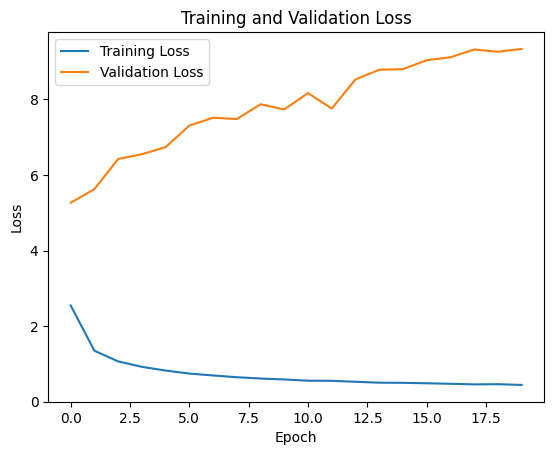

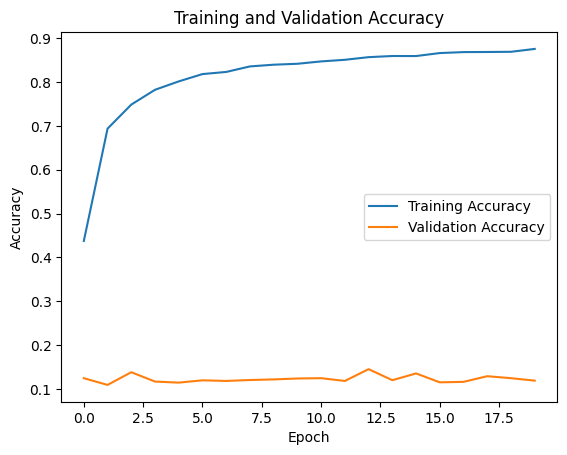

In [ ]:
import matplotlib.pyplot as plt

# Plot training and validation loss
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.show()

# Plot training and validation accuracy
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Validation Accuracy')
plt.legend()
plt.show()


In [ ]:
import keras_tuner as kt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import LSTM, Dense
from tensorflow.keras.optimizers import Adam
import numpy as np

# Define the model building function
def build_model(hp):
    model = Sequential([
        # Using an Input layer as per the warning
        LSTM(
            hp.Int('units', min_value=32, max_value=128, step=32),
            input_shape=(sequence_length, len(features))
        ),
        Dense(len(np.unique(y)), activation='softmax')
    ])
    model.compile(
        optimizer=Adam(learning_rate=hp.Choice('learning_rate', [1e-2, 1e-3, 1e-4])),
        loss='sparse_categorical_crossentropy',
        metrics=['accuracy']
    )
    return model

# Initialize the Hyperband tuner
tuner = kt.Hyperband(
    build_model,
    objective='val_accuracy',
    max_epochs=20,
    factor=3,
    directory='my_dir',  # Directory to store tuning logs
    project_name='lstm_tuning'
)

# Perform hyperparameter search
tuner.search(X, y, validation_split=0.2)

# Get the best hyperparameters
best_hps = tuner.get_best_hyperparameters()[0]

# Print the best hyperparameters
print(f"Best units: {best_hps.get('units')}")
print(f"Best learning rate: {best_hps.get('learning_rate')}")



Trial 7 Complete [00h 00m 12s]
val_accuracy: 0.14774711430072784

Best val_accuracy So Far: 0.14774711430072784
Total elapsed time: 00h 02m 18s

Search: Running Trial #8

Value             |Best Value So Far |Hyperparameter
64                |32                |units
0.0001            |0.01              |learning_rate
3                 |3                 |tuner/epochs
0                 |0                 |tuner/initial_epoch
2                 |2                 |tuner/bracket
0                 |0                 |tuner/round

Epoch 1/3
358/358 ━━━━━━━━━━━━━━━━━━━━ 7s 15ms/step - accuracy: 0.1038 - loss: 4.2959 - val_accuracy: 0.0328 - val_loss: 4.1807
Epoch 2/3
335/358 ━━━━━━━━━━━━━━━━━━━━ 0s 7ms/step - accuracy: 0.4222 - loss: 2.9203

KeyboardInterrupt: 

In [ ]:
# Example: Predict for a specific user
user_id = 'QEVuQwEA+47+KNebsMZxVzP77llQYQ=='  # Replace with a specific user_id
user_data = filtered_data[filtered_data['user_id_'] == user_id][features].values

# Create sequences for the user
user_sequences = [user_data[i:i + sequence_length] for i in range(len(user_data) - sequence_length)]

# Predict the next step
predictions = model.predict(np.array(user_sequences))

# Map predictions back to labels
predicted_classes = np.argmax(predictions, axis=1)
print("Predicted Classes:", predicted_classes)


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 342ms/step
Predicted Classes: [9 9]
